# **MIE1517 Project : Lung Diagnosis Based on Chest X-ray Pattern**

>**Group 8**

>**Yifan Liu, Liang Ding, Xu Wang, Jiaqing Zhao**

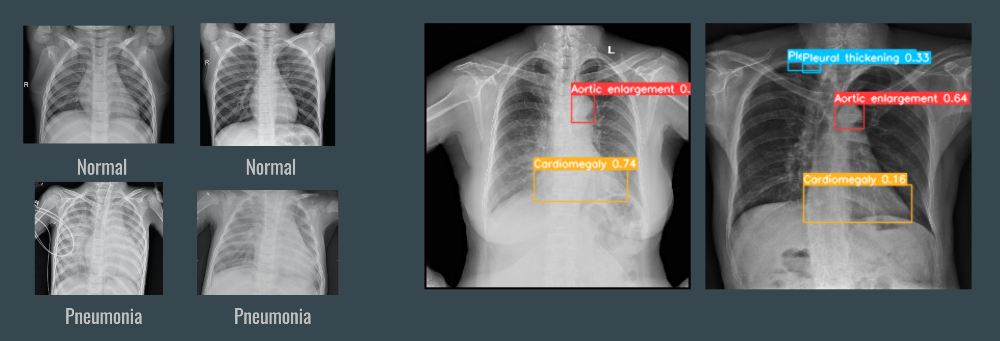

Doctors use imaging techniques like CT, MRI, and X-ray to diagnose and treat patients, Chest X-ray is one of the most frequent and cost-effective examinations. During the pandemic, we would like to focus on lungs and develop a project that can help to ease the pressure on doctors and improve diagnostic accuracy in clinics and hospitals in rural areas. 

In Part 1, We will develop a model that can classify the normal lungs and lungs with abnormal findings based on X-ray images. In part 2, we will explore the object detection technique YOLO and build a model to locate and classify 14 kinds of diseases that often occur in the chest.

#Part 1: Binary classification for normal and pneumonia X-Ray images


In [ ]:
import torchvision
import os
import numpy as np
import torch
import warnings
import random
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import pandas as pd
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import torchvision.models
from google.colab import drive
from PIL import Image
import requests
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Data Processing**

**Obtaining all the data from kaggle and upload to google drive, preprocess the data and split into training set with 4694 images, validation set with 522 images, and testing set with 624 images. The images we are going to use for CNN model are all in grayscale color space.**

**Data downloaded from: https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia to an external site.(Normal: 1341, Pneumonia: 3875)**


In [ ]:
train_val_set, train_set, test_set, val_set = [], [], [], []
trans = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Resize([224,224]),
         transforms.Normalize((0.5), (0.5))])

def load_data(path):

  for foldername1 in os.listdir(path):
    for foldername2 in os.listdir(path + '/' + foldername1):
      for filename in os.listdir(path + '/' + foldername1 + '/' + foldername2):

        if foldername1 == 'train':
          if foldername2 == 'NORMAL':
            image_train_normal = Image.open(path + '/' + foldername1 + '/' + foldername2 + '/' + filename)
            if image_train_normal.mode != 'L':    #convert the image to grayscale if not
              image_train_normal = image_train_normal.convert('L')
            image_train_normal = trans(image_train_normal)    #transform the image to tensor with a fixed size and normalization
            train_val_set.append((image_train_normal, 0))

          else:
            image_train_pneumonia = Image.open(path + '/' + foldername1 + '/' + foldername2 + '/' + filename)
            if image_train_pneumonia.mode != 'L':    #convert the image to grayscale if not
              image_train_pneumonia = image_train_pneumonia.convert('L')
            image_train_pneumonia = trans(image_train_pneumonia)    #transform the image to tensor with a fixed size and normalization
            train_val_set.append((image_train_pneumonia, 1))

        else:
          if foldername2 == 'NORMAL':
            image_test_normal = Image.open(path + '/' + foldername1 + '/' + foldername2 + '/' + filename)
            if image_test_normal.mode != 'L':    #convert the image to grayscale if not
              image_test_normal = image_test_normal.convert('L')
            image_test_normal = trans(image_test_normal)    #transform the image to tensor with a fixed size and normalization
            test_set.append((image_test_normal, 0))

          else:
            image_test_pneumonia = Image.open(path + '/' + foldername1 + '/' + foldername2 + '/' + filename)
            if image_test_pneumonia.mode != 'L':    #convert the image to grayscale if not
              image_test_pneumonia = image_test_pneumonia.convert('L')
            image_test_pneumonia = trans(image_test_pneumonia)    #transform the image to tensor with a fixed size and normalization
            test_set.append((image_test_pneumonia, 1))



In [ ]:
path = '/content/drive/MyDrive/MIE1517/Project_data/'
load_data(path)
random.shuffle(train_val_set)   #shuffle the dataset
random.shuffle(test_set)
train_set = train_val_set[:round(0.9*len(train_val_set))]
val_set = train_val_set[round(0.9*len(train_val_set)):]

In [ ]:
print('The number of trainning images: ', len(train_set))
print('The number of validation images: ', len(val_set))
print('The number of testing images: ', len(test_set))
print('Shape of train image:', train_set[0][0].shape)

The number of trainning images:  4694
The number of validation images:  522
The number of testing images:  624
Shape of train image: torch.Size([1, 224, 224])


## **Data Visualization**

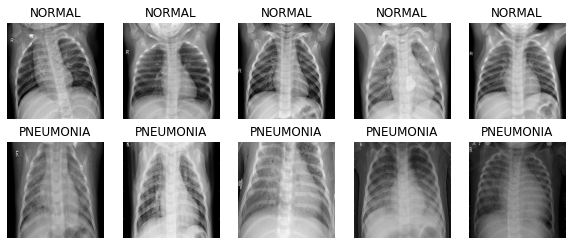

In [ ]:
plt.figure(figsize=(10, 4))
i = 0
for image, label in train_set:    #plot 5 normal x-ray images
  if i >= 5: 
    break
  elif label == 0:
    plt.subplot(2, 5, i + 1)
    plt.axis('off')
    plt.title("NORMAL")
    arr = np.asarray(image[0])
    plt.imshow(arr, cmap='gray')
    i += 1

j = 0
for image, label in train_set:    #plot 5 pneumonia x-ray images
  if j >= 5: 
    break
  elif label == 1:
    plt.subplot(2, 5, 5 + j + 1)
    plt.axis('off')
    plt.title("PNEUMONIA")
    arr = np.asarray(image[0])
    plt.imshow(arr, cmap='gray')
    j += 1

## **Useful Functions**

In [ ]:
def get_accuracy(model, train_data, val_data, batch_size, train=False):

    if train:
        data = train_data
    else:
        data = val_data

    correct = 0
    total = 0
    for imgs, labels in torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True):
        
        if torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
              
        output = model(imgs)
        
        for i in range(len(output)):
          if output[i] < 0.5 and labels[i] == 0:
            correct += 1
          elif output[i] > 0.5 and labels[i] == 1:
            correct += 1
        
        total += imgs.shape[0]
        
    return correct / total

In [ ]:
def train(model, train_data, val_data = None, batch_size=64, learning_rate = 0.01, num_epochs=1):

    train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

    iters, losses, train_acc, val_acc = [], [], [], []

    n = 0 # the number of iterations
    for epoch in range(num_epochs):

        val_accuracy = ''
        for imgs, labels in iter(train_loader):
          
            if torch.cuda.is_available():
              imgs = imgs.cuda()
              labels = labels.cuda()
                  
            out = model(imgs)             # forward pass
            labels = labels.unsqueeze(1).float()
            loss = criterion(out, labels) # compute the total loss
            loss.backward()               # backward pass (compute parameter updates)
            optimizer.step()              # make the updates for each parameter
            optimizer.zero_grad()         # a clean up step for PyTorch

            # save the current training information
            iters.append(n)
            losses.append(float(loss)/batch_size)             # compute *average* loss
            train_acc.append(get_accuracy(model, train_data, val_data, batch_size, train=True)) # compute training accuracy 
            val_acc.append(get_accuracy(model, train_data, val_data, batch_size, train=False))  # compute validation accuracy
            val_accuracy = ' Validation accuracy: ' + str(val_acc[-1])
            n += 1

        print(('Epoch {}: Train loss: {} Train accuracy: {} ' + val_accuracy).format(epoch, losses[-1], train_acc[-1]))    #checkpoint for each epoch

    # plotting
    plt.title("Training Curve")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Training Curve")
    plt.plot(iters, train_acc, label="Train")  
    plt.plot(iters, val_acc, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))  
    print("Final Validation Accuracy: {}".format(val_acc[-1]))

In [ ]:
def get_cofusion_matrix(model, data, batch_size):   #return a list of ground truth and a list of predictions to build confusion matrix

    targets = []
    pred = []
    for imgs, labels in torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True):
        
        if torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
              
        output = model(imgs)
        
        for i in range(len(output)):
          targets.append(labels[i].item())
          if output[i] <= 0.5:
            pred.append(0)
          elif output[i] > 0.5:
            pred.append(1)
        
    return targets, pred

## **CNN Model and train**

**In this section, a convolutional neural network is built for binary classification with X-ray images as inputs. The model is built with 2 convolutional layers and 2 fully connected layers, and it takes grayscale image which has a dimension of 1\*224\*224 as input features.**

In [ ]:
class CNN(nn.Module):

    def __init__(self):
        super(CNN, self).__init__()
        self.name = 'CNN'
        self.conv1 = nn.Conv2d(1, 5, 5)
        self.pool = nn.MaxPool2d(2, 2) 
        self.conv2 = nn.Conv2d(5, 10, 5)
        self.fc1 = nn.Linear(28090, 32)
        self.fc2 = nn.Linear(32, 1)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 28090)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
model = CNN()

In [ ]:
from torchsummary import summary
summary(model, (1,224,224), 128,device="CPU")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [128, 5, 220, 220]             130
         MaxPool2d-2         [128, 5, 110, 110]               0
            Conv2d-3        [128, 10, 106, 106]           1,260
         MaxPool2d-4          [128, 10, 53, 53]               0
            Linear-5                  [128, 32]         898,912
            Linear-6                   [128, 1]              33
Total params: 900,335
Trainable params: 900,335
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 24.50
Forward/backward pass size (MB): 432.60
Params size (MB): 3.43
Estimated Total Size (MB): 460.54
----------------------------------------------------------------


CUDA is available!  Training on GPU ...
Epoch 0: Train loss: 0.0017781187780201435 Train accuracy: 0.9190455901150405  Validation accuracy: 0.9272030651340997
Epoch 1: Train loss: 0.0013950068969279528 Train accuracy: 0.9505752023860247  Validation accuracy: 0.946360153256705
Epoch 2: Train loss: 0.0007310580112971365 Train accuracy: 0.9535577332765233  Validation accuracy: 0.9636015325670498
Epoch 3: Train loss: 0.00048717387835495174 Train accuracy: 0.9652748189177673  Validation accuracy: 0.9597701149425287
Epoch 4: Train loss: 0.0009728817967697978 Train accuracy: 0.9701746910950149  Validation accuracy: 0.9731800766283525
Epoch 5: Train loss: 0.0009946041973307729 Train accuracy: 0.967831273966766  Validation accuracy: 0.9789272030651341
Epoch 6: Train loss: 0.00034585644607432187 Train accuracy: 0.9731572219855135  Validation accuracy: 0.9731800766283525
Epoch 7: Train loss: 0.00018086332420352846 Train accuracy: 0.9737963357477631  Validation accuracy: 0.9827586206896551
Epoch 8

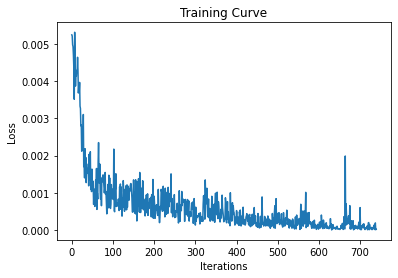

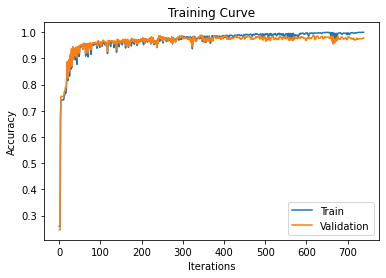

Final Training Accuracy: 0.9995739241585002
Final Validation Accuracy: 0.9770114942528736


In [ ]:
model = CNN()
if torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
train(model = model, train_data = train_set, val_data = val_set, batch_size = 128, learning_rate = 0.02, num_epochs = 20)

##predict on test dataset

In [ ]:
test_accuracy = get_accuracy(model, test_set, None, 128, True)    #test the model on test set
print('The test accuracy of the model is ' + str(test_accuracy))

The test accuracy of the model is 0.7387820512820513


<Figure size 432x288 with 0 Axes>

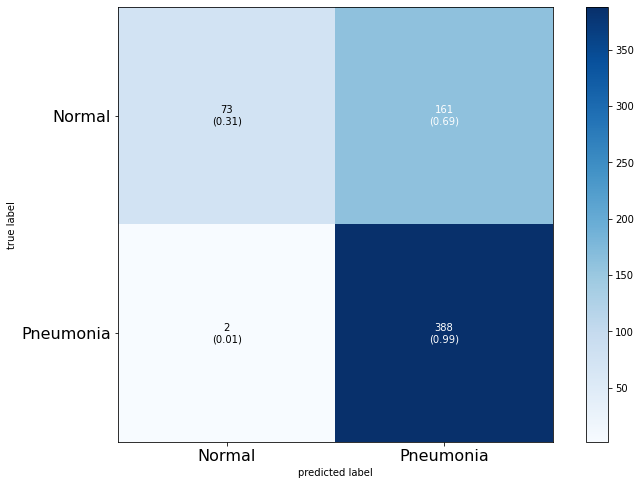

In [ ]:
targets, pred = get_cofusion_matrix(model, test_set, 128)

#plot the confusion matrix for test set
cm = confusion_matrix(targets, pred)
plt.figure()
plot_confusion_matrix(cm, figsize = (12, 8), hide_ticks = True, colorbar=True, show_normed=True, cmap = plt.cm.Blues)
plt.xticks(range(2), ['Normal', 'Pneumonia'], fontsize = 16)
plt.yticks(range(2), ['Normal', 'Pneumonia'], fontsize = 16)
plt.show()

## **Data Processing for Densenet**

In [ ]:
train_val_set_rgb, train_set_rgb, test_set_rgb, val_set_rgb = [], [], [], []
trans = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Resize([224,224]),
         transforms.Normalize((0.5), (0.5))])

def load_data_rgb(path):

  for foldername1 in os.listdir(path):
    for foldername2 in os.listdir(path + '/' + foldername1):
      for filename in os.listdir(path + '/' + foldername1 + '/' + foldername2):

        if foldername1 == 'train':
          if foldername2 == 'NORMAL':
            image_train_normal = Image.open(path + '/' + foldername1 + '/' + foldername2 + '/' + filename)
            if image_train_normal.mode == 'L':    #convert the image to RGB if not
              image_train_normal = image_train_normal.convert('RGB')
            image_train_normal = trans(image_train_normal)    #transform the image to tensor with a fixed size and normalization
            train_val_set_rgb.append((image_train_normal, 0))

          else:
            image_train_pneumonia = Image.open(path + '/' + foldername1 + '/' + foldername2 + '/' + filename)
            if image_train_pneumonia.mode == 'L':    #convert the image to RGB if not
              image_train_pneumonia = image_train_pneumonia.convert('RGB')
            image_train_pneumonia = trans(image_train_pneumonia)    #transform the image to tensor with a fixed size and normalization
            train_val_set_rgb.append((image_train_pneumonia, 1))

        else:
          if foldername2 == 'NORMAL':
            image_test_normal = Image.open(path + '/' + foldername1 + '/' + foldername2 + '/' + filename)
            if image_test_normal.mode == 'L':    #convert the image to RGB if not
              image_test_normal = image_test_normal.convert('RGB')
            image_test_normal = trans(image_test_normal)    #transform the image to tensor with a fixed size and normalization
            test_set_rgb.append((image_test_normal, 0))

          else:
            image_test_pneumonia = Image.open(path + '/' + foldername1 + '/' + foldername2 + '/' + filename)
            if image_test_pneumonia.mode == 'L':    #convert the image to RGB if not
              image_test_pneumonia = image_test_pneumonia.convert('RGB')
            image_test_pneumonia = trans(image_test_pneumonia)    #transform the image to tensor with a fixed size and normalization
            test_set_rgb.append((image_test_pneumonia, 1))

In [ ]:
path = '/content/drive/MyDrive/MIE1517/Project_data/'
load_data_rgb(path)
random.shuffle(train_val_set_rgb)   #shuffle the datasets
random.shuffle(test_set_rgb)
train_set_rgb = train_val_set_rgb[:round(0.9*len(train_val_set_rgb))]
val_set_rgb = train_val_set_rgb[round(0.9*len(train_val_set_rgb)):]

## **Densenet Model and train**

**In this section, transfer learning with densenet is used for the binary classification task. A DenseNet is a type of convolutional neural network that utilises dense connections between layers, through Dense Blocks, where we connect all layers (with matching feature-map sizes) directly with each other. To preserve the feed-forward nature, each layer obtains additional inputs from all preceding layers and passes on its own feature-maps to all subsequent layers.**
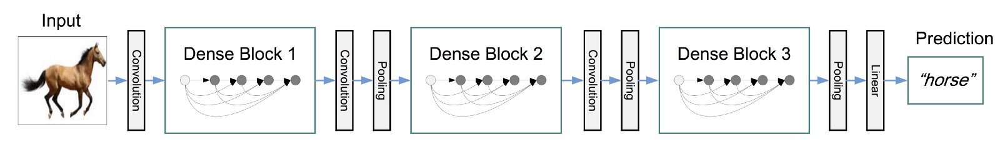


In [ ]:
densenet = torchvision.models.densenet121(pretrained=True)

train_features, test_features, val_features = [], [], []

#convert all 3 datasets to densenet features
for img, label in iter(train_set_rgb):
  features = densenet.features(img.unsqueeze(0))
  train_features.append((torch.from_numpy(features.detach().numpy()), label))
for img, label in iter(test_set_rgb):
  features = densenet.features(img.unsqueeze(0))
  test_features.append((torch.from_numpy(features.detach().numpy()), label))
for img, label in iter(val_set_rgb):
  features = densenet.features(img.unsqueeze(0))
  val_features.append((torch.from_numpy(features.detach().numpy()), label))

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


  0%|          | 0.00/30.8M [00:00<?, ?B/s]

In [ ]:
class Densenet(nn.Module):
    def __init__(self):
        super(Densenet, self).__init__()
        self.name = 'Densenet'
        self.fc1 = nn.Linear(1024 * 7 * 7, 10)
        self.fc2 = nn.Linear(10, 1)

    def forward(self, x):
        x = x.view(-1, 1024 * 7 * 7) #flatten feature data
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        
        return x

CUDA is available!  Training on GPU ...
Epoch 0: Train loss: 0.00018548982916399837 Train accuracy: 0.9946740519812527  Validation accuracy: 0.9731800766283525
Epoch 1: Train loss: 3.605382880778052e-05 Train accuracy: 0.9997869620792501  Validation accuracy: 0.9731800766283525
Epoch 2: Train loss: 2.5415864001843147e-05 Train accuracy: 1.0  Validation accuracy: 0.9770114942528736
Epoch 3: Train loss: 6.067368303774856e-06 Train accuracy: 1.0  Validation accuracy: 0.975095785440613
Epoch 4: Train loss: 3.720067525136983e-06 Train accuracy: 1.0  Validation accuracy: 0.975095785440613
Epoch 5: Train loss: 3.713659680215642e-06 Train accuracy: 1.0  Validation accuracy: 0.9770114942528736
Epoch 6: Train loss: 1.3341308431336074e-06 Train accuracy: 1.0  Validation accuracy: 0.975095785440613
Epoch 7: Train loss: 3.0867327041050885e-06 Train accuracy: 1.0  Validation accuracy: 0.975095785440613
Epoch 8: Train loss: 5.126316409587162e-06 Train accuracy: 1.0  Validation accuracy: 0.97509578544

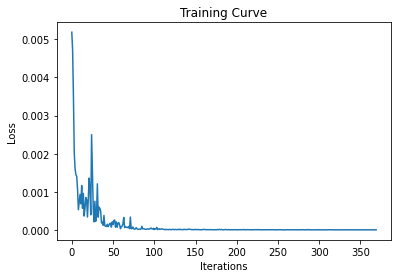

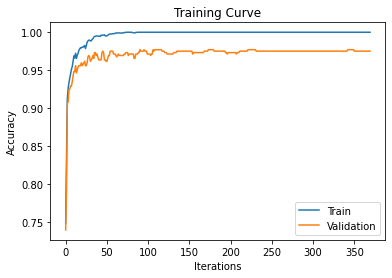

Final Training Accuracy: 1.0
Final Validation Accuracy: 0.975095785440613


In [ ]:
model_densenet = Densenet()
if torch.cuda.is_available():
  model_densenet.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
train(model = model_densenet, train_data = train_features, val_data = val_features, batch_size = 128, learning_rate = 0.005, num_epochs = 10)

##predict on test dataset

In [ ]:
test_accuracy_densenet = get_accuracy(model_densenet, test_features, None, 128, True)    #test the model on test set
print('The test accuracy of the densenet model is ' + str(test_accuracy_densenet))

The test accuracy of the densenet model is 0.8076923076923077


<Figure size 432x288 with 0 Axes>

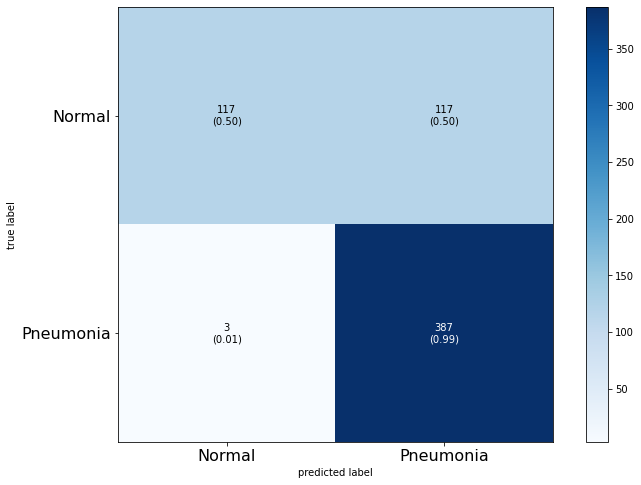

In [ ]:
targets, pred = get_cofusion_matrix(model_densenet, test_features, 128)

#plot the confusion matrix for test set
cm = confusion_matrix(targets, pred)
plt.figure()
plot_confusion_matrix(cm, figsize = (12, 8), hide_ticks = True, colorbar=True, show_normed=True, cmap = plt.cm.Blues)
plt.xticks(range(2), ['Normal', 'Pneumonia'], fontsize = 16)
plt.yticks(range(2), ['Normal', 'Pneumonia'], fontsize = 16)
plt.show()

## **Result Discussion**

In the first part, we get 97% validation accuracy and 80% test accuracy using densenet in classifying Chest X-Rays, which is higher than that of CNN and Alexnet. From the confusion matrix, the model worked very well on chest x-rays with Pneumonia but not so well for normal x-rays. In fact, the performance in normal chest X-rays is close to random guessing.（high recall,ordinary precision, aka, the ratio of retrieved items relevant is low, which is acceptable compared to low recall in pneumonia, which is the least we want to see.)


## **Reference**


*   https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumoniaLinks
*   https://paperswithcode.com/method/densenet




#Part 2: Object detection for locating and classifying the diseases from X-Ray images

In [ ]:
import numpy as np, pandas as pd
from glob import glob
import shutil, os
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupKFold
from tqdm.notebook import tqdm

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Data Processing

Obtaining original data from https://www.kaggle.com/datasets/awsaf49/vinbigdata-256-image-dataset, which mainly provides




*   1）15k .png X-ray train images (256x256 pixels)
*   2）3k .png X-ray test images (256x256 pixels)
*   3）train.csv, containing image IDs, disease labels and corresponding bbox coordinates.
*   4）test.csv, containing image IDs.


For each training image, several bounding box locations of diagnosed diseases are recorded by the x-y coordinates of two corners. Because of the implementation requirement of YOLO module, we need to convert these coordinates from pixel-based locations to proportion-based locations. Construct a dataframe to do the processing. Later on use it to output separate label text files per training image. 

In the text files, each row has 5 elements, which are class number of the disease, x_mid and y_mid that store the center location of bounding box, and w,h that represent the width of height of the bounding box. All location and length are proportion-based. A archived text files of labels can be found here: https://www.kaggle.com/datasets/awsaf49/vinbigdata-yolo-labels-dataset

In [ ]:
#Construct a dataframe for train set
train_csv_path = '/content/drive/MyDrive/MIE1517/project/vinbigdata/train.csv'
train_set = pd.read_csv(train_csv_path)
#store the google drive address of each image
train_set['image_path'] = "/content/drive/MyDrive/MIE1517/project/vinbigdata/train/" + train_set['image_id'] + '.png'
#exclude images with class_id=14, which are normal images with no diseases
train_set = train_set[train_set.class_id != 14].reset_index(drop = True)

train_set.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,/content/drive/MyDrive/MIE1517/project/vinbigd...
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,/content/drive/MyDrive/MIE1517/project/vinbigd...
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0,2540,3072,/content/drive/MyDrive/MIE1517/project/vinbigd...
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,2285,2555,/content/drive/MyDrive/MIE1517/project/vinbigd...
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0,2568,3353,/content/drive/MyDrive/MIE1517/project/vinbigd...


In [ ]:
#Data preprocessing
def feature_norm(column_name, data_set):

  data_set[column_name] = data_set.apply(
      lambda row: row[column_name] / row[('height' if 'y' in column_name else 'width')], axis = 1)
  
def feature_build(max, min, data_set):

  if 'y' in max and 'y' in min:
    data_set['y_mid'] = data_set.apply(
      lambda row: (row[max] + row[min]) / 2, axis = 1)
    data_set['h'] = data_set.apply(
      lambda row: row[max] - row[min], axis = 1)
  else:
    data_set['x_mid'] = data_set.apply(
      lambda row: (row[max] + row[min]) / 2, axis = 1)
    data_set['w'] = data_set.apply(
      lambda row: row[max] - row[min], axis = 1)

for j in ['x_min', 'y_min', 'x_max', 'y_max']:
  feature_norm(j, train_set)

feature_build(max = 'x_max', min = 'x_min', data_set = train_set)
feature_build(max = 'y_max', min = 'y_min', data_set = train_set)

train_set['area'] = train_set['w']*train_set['h']

train_set.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,w,y_mid,h,area
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.563462,0.462500,0.686216,0.195205,0.090283
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.623915,0.150608,0.305903,0.095833,0.014433
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.309843,0.125984,0.128581,0.024740,0.003117
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.773523,0.368053,0.472407,0.753033,0.277156
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.239875,0.045950,0.721145,0.039368,0.001809


In [ ]:
X = train_set[['x_min', 'y_min', 'x_max', 'y_max', 'x_mid', 'y_mid', 'w', 'h','area']]
y = train_set['class_id']
X.shape, y.shape

((36096, 9), (36096,))

In [ ]:
gp=train_set.groupby(by=["class_name","class_id"]).count()
gp.index.levels[0]

Index(['Aortic enlargement', 'Atelectasis', 'Calcification', 'Cardiomegaly',
       'Consolidation', 'ILD', 'Infiltration', 'Lung Opacity', 'Nodule/Mass',
       'Other lesion', 'Pleural effusion', 'Pleural thickening',
       'Pneumothorax', 'Pulmonary fibrosis'],
      dtype='object', name='class_name')

In [ ]:
#store the names of diseases
classes=list(gp.index.levels[0])

##Split

In this dataset, each training image may get labeled several times in most cases. Because more than one disease may occur in one image, reported by the radiologist. Furthermore, the same disease could get labeled by different radiologists many times.

In the domain of medical image processing, it's common to use GroupKfold rather than simple KFold to do train, validation and test splitting, because GroupKFold could ensure that images from one patient are all allocated to the same folder.

At the end, the training set has 3515 images and the validation set has 879 images.

In [ ]:
gkf  = GroupKFold(n_splits = 5)
train_set['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(train_set, groups = train_set.image_id.tolist())):
    train_set.loc[val_idx, 'fold'] = fold
train_set.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,w,y_mid,h,area,fold
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.563462,0.462500,0.686216,0.195205,0.090283,3
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.623915,0.150608,0.305903,0.095833,0.014433,2
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.309843,0.125984,0.128581,0.024740,0.003117,4
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.773523,0.368053,0.472407,0.753033,0.277156,2
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,/content/drive/MyDrive/MIE1517/project/vinbigd...,0.239875,0.045950,0.721145,0.039368,0.001809,4


In [ ]:
#Select folder 4 as validation set
train_files = []
val_files   = []
print("current folder: ",fold)
val_files = list(train_set[train_set.fold==fold].image_path.unique())
train_files = list(train_set[train_set.fold!=fold].image_path.unique())
print("# of train set files: ",len(train_files))
print("# of validation set files: ",len(val_files))

current folder:  4
# of train set files:  3515
# of validation set files:  879


##copying files

The object detection program using YOLO requires a separate working directory to store all the input data, including training, validation and test set images and labels of training and validation set.

In [ ]:
os.makedirs('/content/drive/MyDrive/MIE1517/project/vinbigdata/labels', exist_ok = True) 
os.makedirs('/content/drive/MyDrive/MIE1517/project/vinbigdata/val', exist_ok = True) 
#unzip pre-collected label text files to working directory
!unzip "/content/drive/MyDrive/MIE1517/project/vinbigdata/archive.zip" -d "/content/drive/MyDrive/MIE1517/project/vinbigdata/labels"

In [ ]:
os.makedirs('/content/working/vinbigdata/labels/train', exist_ok = True)
os.makedirs('/content/working/vinbigdata/labels/val', exist_ok = True)
os.makedirs('/content/working/vinbigdata/images/train', exist_ok = True)
os.makedirs('/content/working/vinbigdata/images/val', exist_ok = True)
label_dir = '/content/drive/MyDrive/MIE1517/project/vinbigdata/labels/labels'

In [ ]:
for file in tqdm(val_files):
    shutil.copy(file, '/content/drive/MyDrive/MIE1517/project/vinbigdata/val')
    #filename = file.split('/')[-1].split('.')[0]
    #shutil.copy(os.path.join(label_dir, filename+'.txt'), '/content/working/vinbigdata/labels/val')

  0%|          | 0/879 [00:00<?, ?it/s]

In [ ]:
for file in tqdm(train_files):
    shutil.copy(file, '/content/working/vinbigdata/images/train')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir, filename+'.txt'), '/content/working/vinbigdata/labels/train')

  0%|          | 0/3515 [00:00<?, ?it/s]

##YOLOv5 Stuff

To train a YOLOv5 model, first we need to install the yolo package. The module provides pretty integrated programs such as train.py and detect.py, which are used to train the model and predict on un-seen data. For this reason, we need to create a configuration file as input to the YOLO programs. The config file contains the addresses of our data in working directory and other important arguments.

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14432, done.
remote: Counting objects: 100% (61/61), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 14432 (delta 35), reused 37 (delta 20), pack-reused 14371
Receiving objects: 100% (14432/14432), 13.63 MiB | 8.99 MiB/s, done.
Resolving deltas: 100% (9929/9929), done.


In [ ]:
from os import listdir
from os.path import isfile, join
import yaml

cwd = '/content/working/'

with open(join( cwd , 'train.txt'), 'w') as f:
    for path in glob('/content/working/vinbigdata/images/train/*'):
        f.write(path+'\n')
            
with open(join( cwd , 'val.txt'), 'w') as f:
    for path in glob('/content/working/vinbigdata/images/val/*'):
        f.write(path+'\n')

data = dict(
    train =  join( cwd , 'train.txt') ,
    val   =  join( cwd , 'val.txt' ),
    nc    = 14,
    names = classes
    )

with open(join( cwd , 'vinbigdata.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(join( cwd , 'vinbigdata.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- Aortic enlargement
- Atelectasis
- Calcification
- Cardiomegaly
- Consolidation
- ILD
- Infiltration
- Lung Opacity
- Nodule/Mass
- Other lesion
- Pleural effusion
- Pleural thickening
- Pneumothorax
- Pulmonary fibrosis
nc: 14
train: /content/working/train.txt
val: /content/working/val.txt



In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
import torch
from IPython.display import Image, clear_output

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.13.0+cu116 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
#Try on sample image to load the functions
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/
Image(filename='runs/detect/exp/zidane.jpg', width=600)

##Train

In this project we usd `v5x`. To change the pre-trained model, just replace `--weights yolov5s.pt` with :
* `--weights yolov5s.pt`
* `--weights yolov5m.pt`
* `--weights yolov5l.pt`
* `--weights yolov5x.pt`

After training is done, a folder `runs/train/exp/` will be created where most results are stored.

In [ ]:
!WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 30 --data /content/working/vinbigdata.yaml --weights yolov5x.pt --cache

###Training batch images

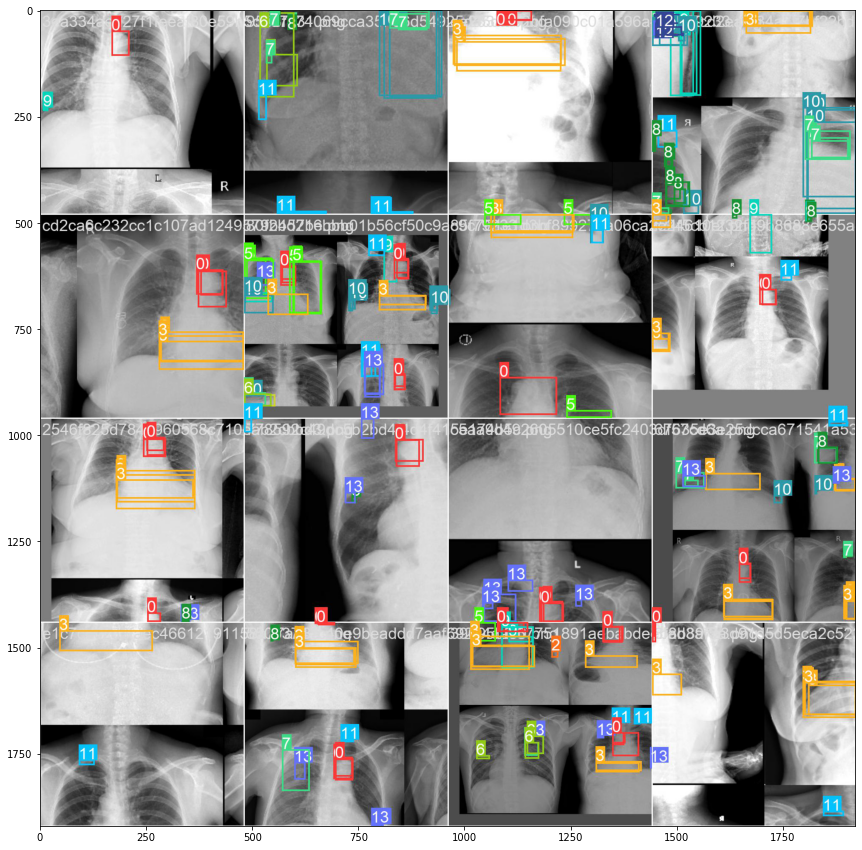

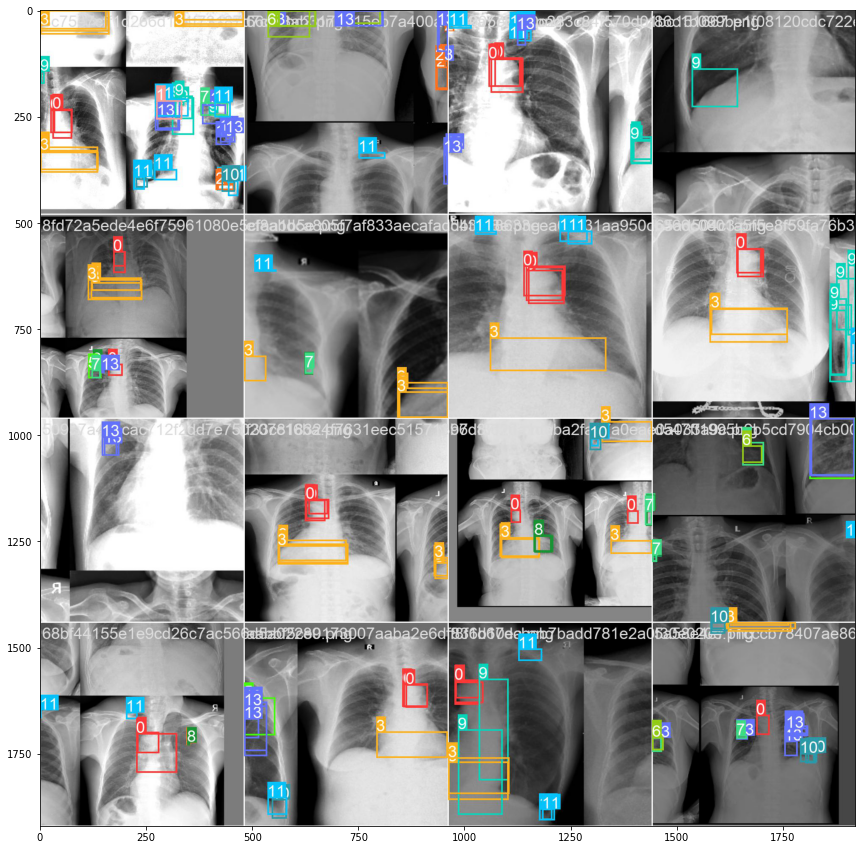

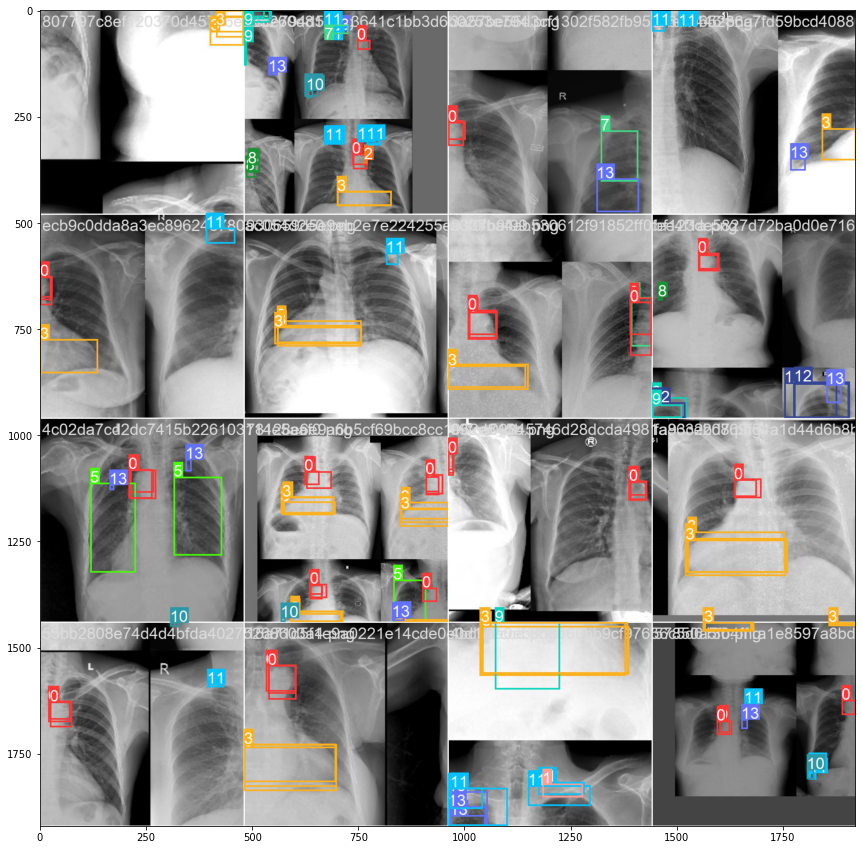

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch1.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch2.jpg'))

###Ground Truth Vs Prediction

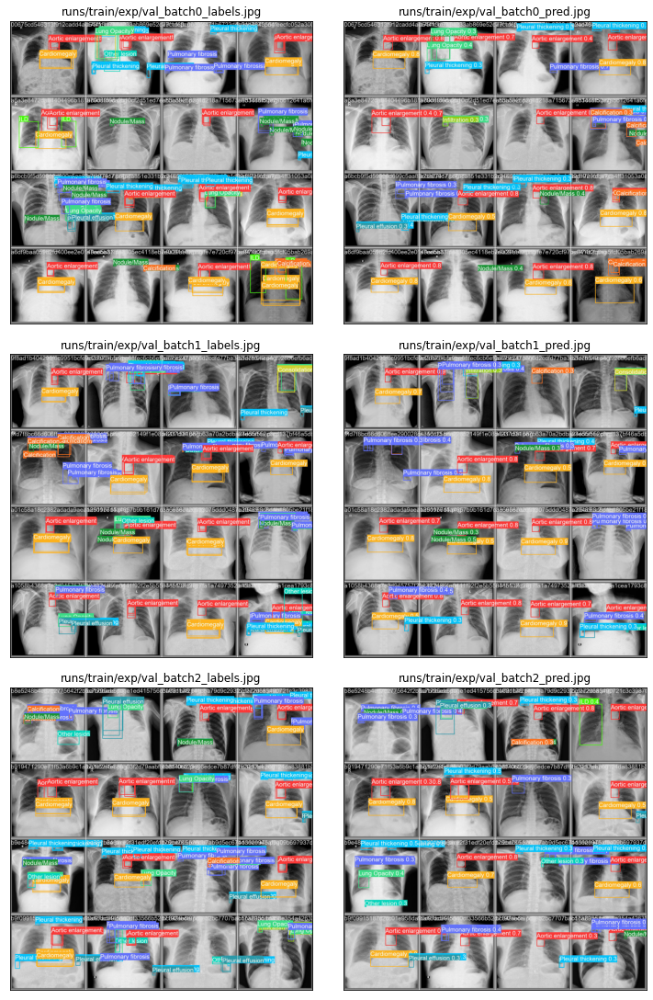

In [ ]:
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'runs/train/exp/val_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/exp/val_batch{row}_labels.jpg', fontsize = 12)
    
    ax[row][1].imshow(plt.imread(f'runs/train/exp/val_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/exp/val_batch{row}_pred.jpg', fontsize = 12)

###(Loss, Map) Vs Epoch

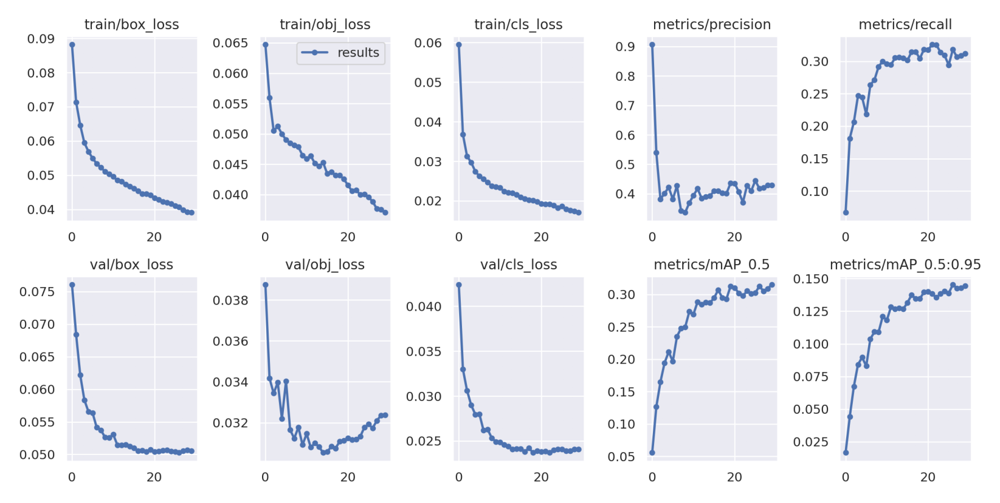

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/results.png'))

###Confusion matrix and PR-curve

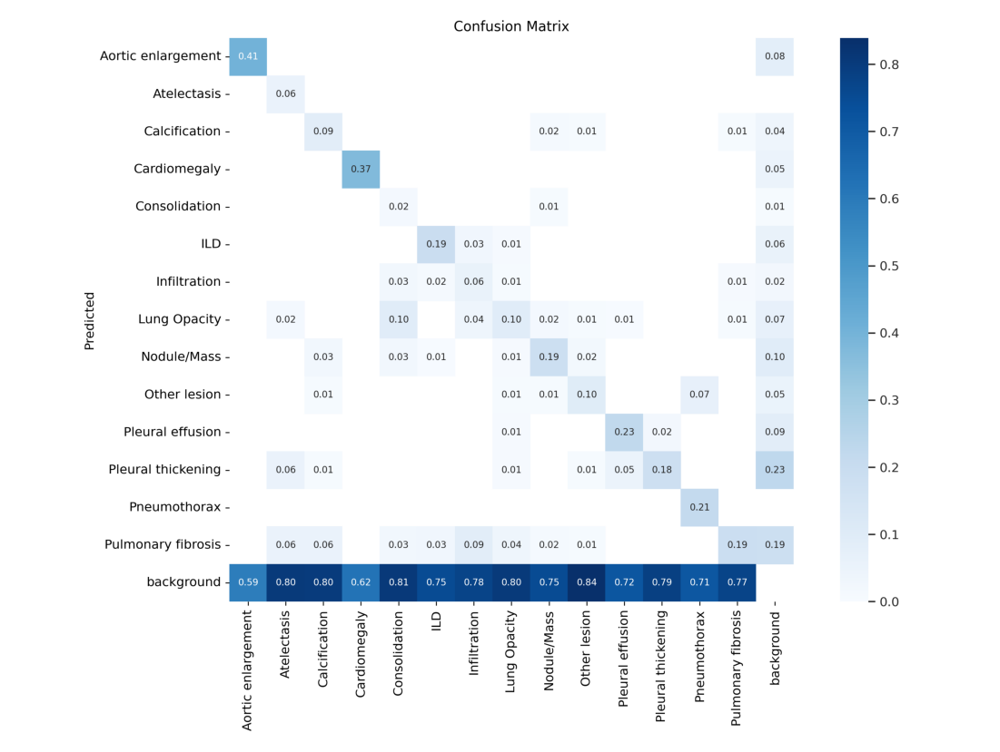

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/confusion_matrix.png'))

From the confusion matrix, the model detects Aortic enlargement and Cardiomegaly most accurately. Actually, these two disease are most frequently reported by the radiologists in this dataset.

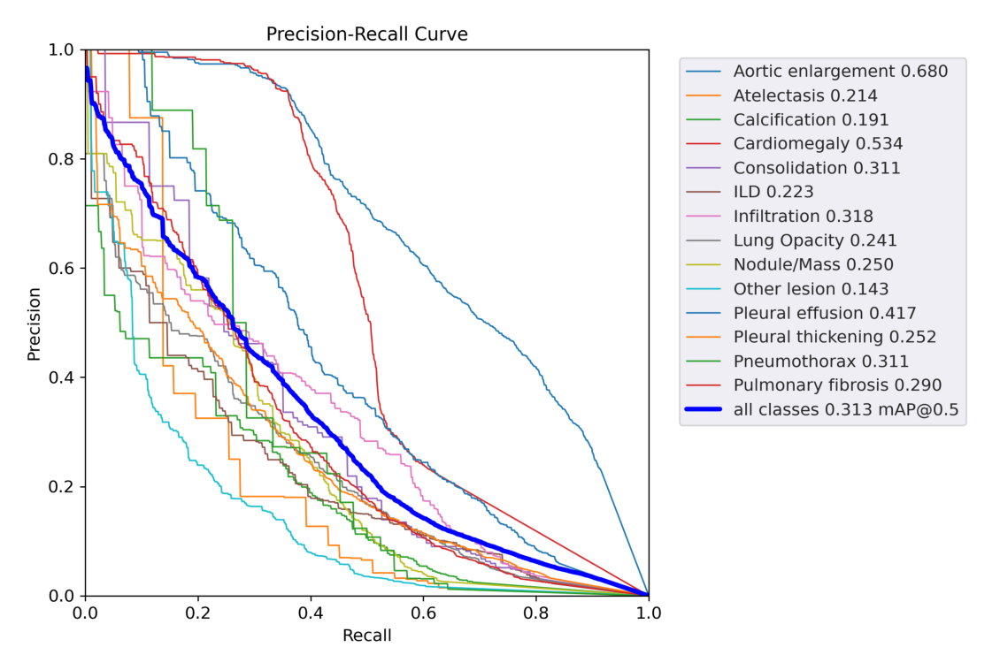

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('/content/yolov5/runs/train/exp/PR_curve.png'));

##Result discussion

For the second part of the project, we performed an object detection and classification on 14 types of chest abnormalities. Our model's final Mean Average Precision at 0.5 IoU is about 0.313. Which is not a very bad result for this specific task. From the prediction result, our model did correctly identify the abnormalities and classify them, with the majority samples correctly identified falling in the main diagonal of the confusion matrix. 

##Predict on never seen data

In [ ]:
!python detect.py --weights 'runs/train/exp/weights/best.pt'\
--img 640\
--conf 0.15\
--iou 0.5\
--source /content/drive/MyDrive/MIE1517/project/vinbigdata/test\
--exist-ok\
--name test_result\
--line-thickness 1

  0%|          | 0/16 [00:00<?, ?it/s]

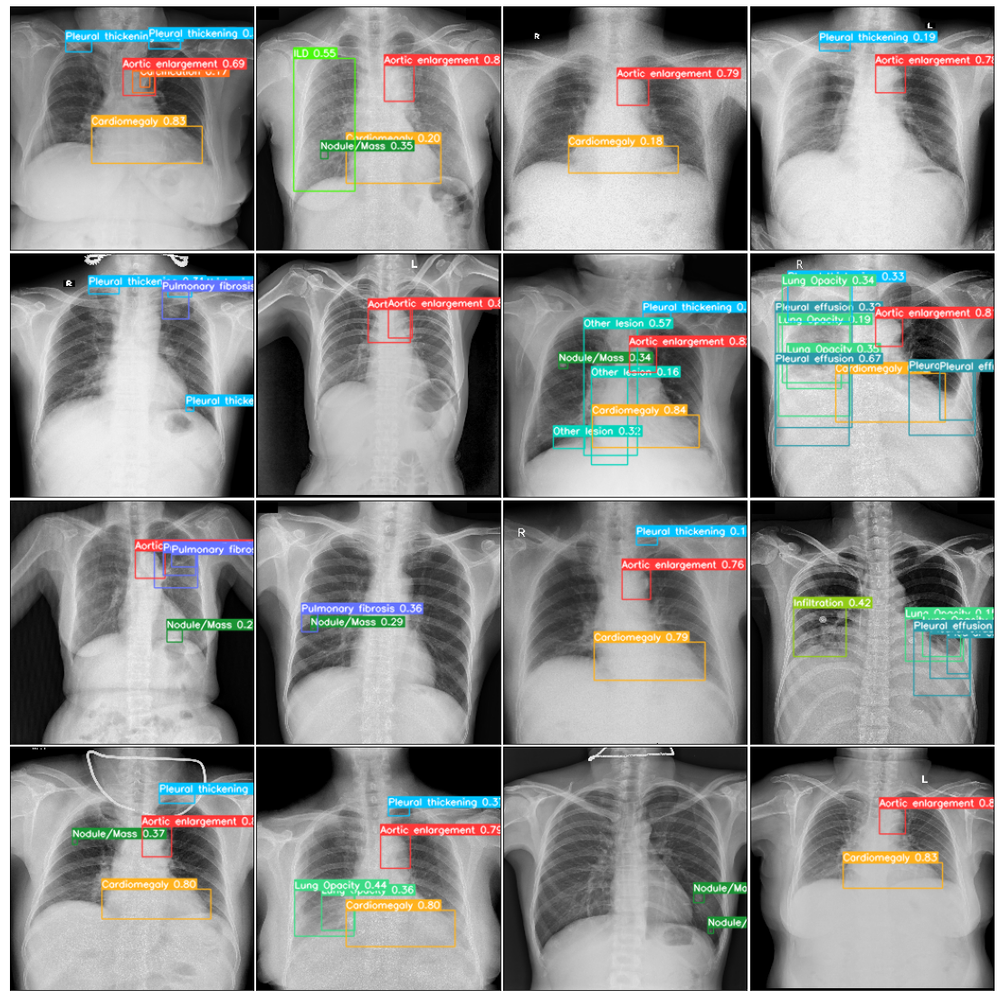

  0%|          | 0/16 [00:00<?, ?it/s]

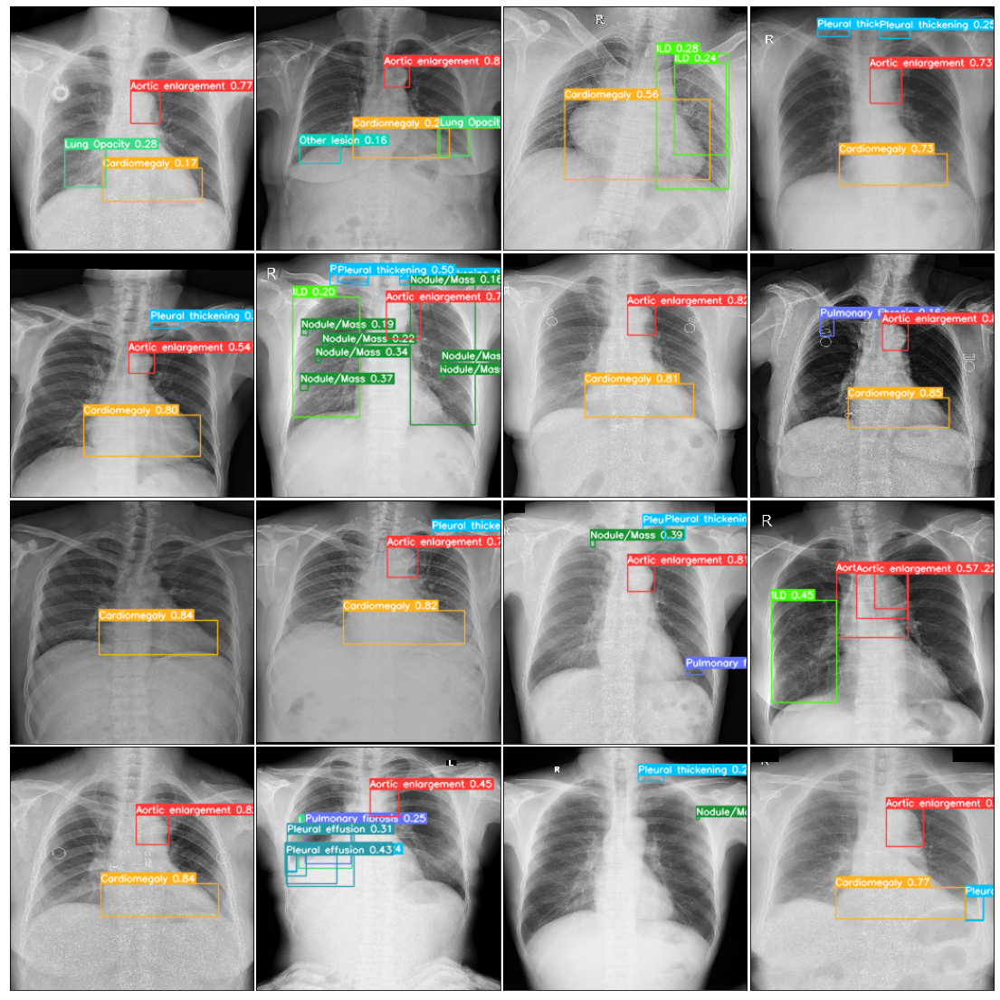

  0%|          | 0/16 [00:00<?, ?it/s]

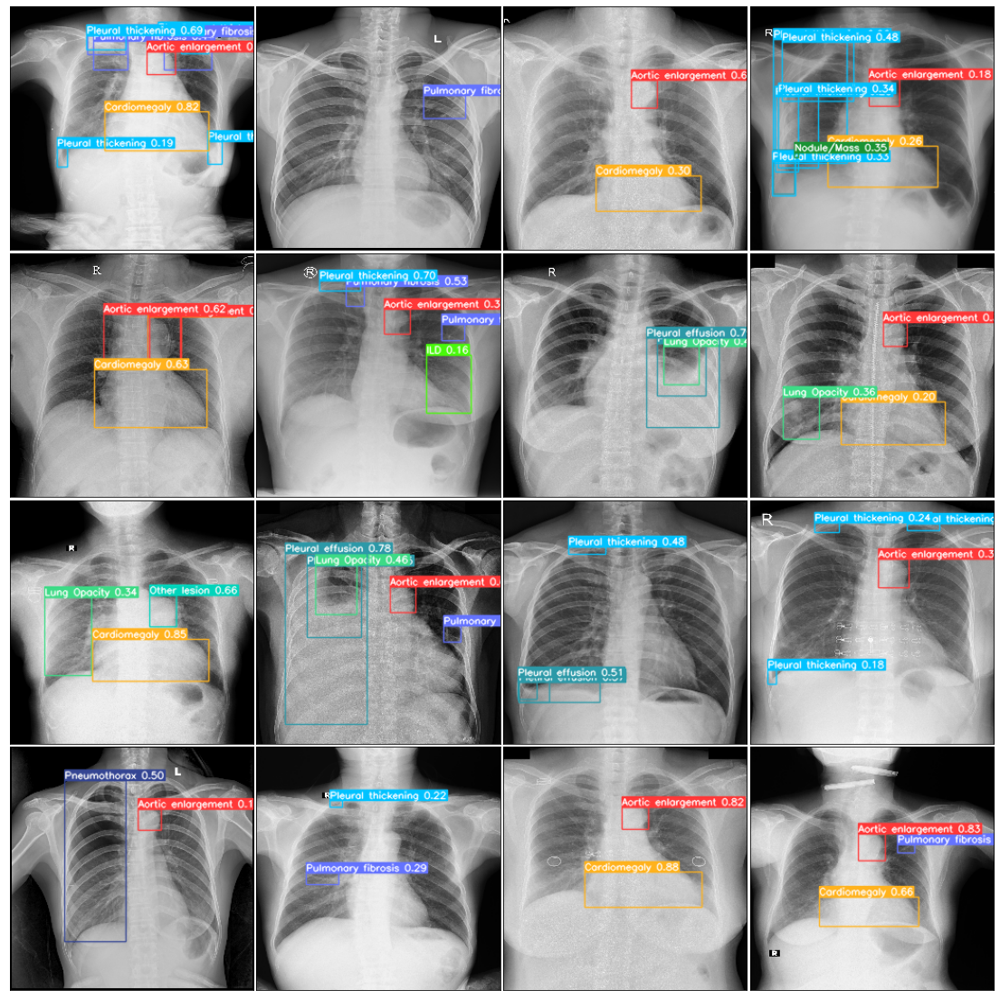

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid
import random
import cv2

files = glob('/content/yolov5/runs/detect/val_result/*')
for _ in range(3):
    row = 4
    col = 4
    grid_files = random.sample(files, row*col)
    images     = []
    for image_path in tqdm(grid_files):
        img          = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        images.append(img)

    fig = plt.figure(figsize=(col*5, row*5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(col, row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, images):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()

## **Reference**


*   https://www.kaggle.com/competitions/vinbigdata-chest-xray-abnormalities-detection/code?competitionId=24800&sortBy=voteCount
*   https://github.com/ultralytics/yolov5

#Part 3: Thoughts and Learning

Overall, interpreting chest X-ray can be a challenging task. Every chest X-ray is fundamentally a 2d representation of 3d tissues, it is absorbed by multiple structures as they pass the patient's body. Sometimes the differences in density between the pathology and adjacent normal structures may be subtle. Introducing deep learning models will greatly reduce human-made errors.

However, we found that using deep learning models to diagnose X-rays also has limitations. Due to the difference in patient population characteristics and disease distributions, the model may perform well in one context and poorly in another. This explains why we had a much higher validation accuracy than test accuracy. After examining the data, we found out that even the normal chest X-rays show a big difference due to the patient's positioning, degree of inspiration, and exposure level. For example, an underexposed normal chest X-ray could be classified as Pneumonia. In conclusion, our model did well in finding abnormalities, but not sure if it’s a real disease or just noise in the data.

Another problem is that 14 types of chest abnormalities may be too much for a single model to handle. Some diseases will cause multiple abnormalities at the same time, and some abnormalities get stacked together due to the 3d nature of the lung. We will frequently see bounding boxes over the same area but labeled with different classes.

Even if we get a model that may demonstrate a high performance overall on a broad variety of diseases, it may perform poorly in detecting high-risk subtypes. Thus a better way is to train the model on clinically relevant subsets of a specific disease, combined with the patient's clinical history or previous imaging result we can decide which diseases we should check for and which model to use. We think the most difficult part is to obtain such a large dataset with high-quality images and comprehensive labels.

We believe, in the hands of radiologists, a powerful and mature deep learning model will greatly benefit all patients.


In [ ]:
%%shell
jupyter nbconvert --to html /content/MIE1517_Project.ipynb

[NbConvertApp] Converting notebook /content/MIE1517_Project.ipynb to html
[NbConvertApp] Writing 11598775 bytes to /content/MIE1517_Project.html
